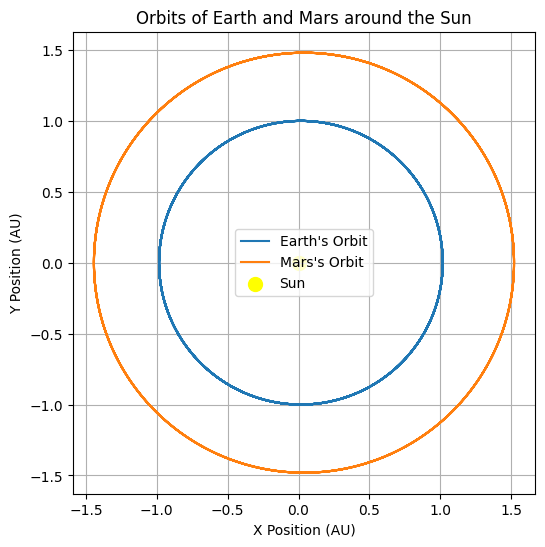

In [3]:
import numpy as np
import matplotlib.pyplot as plt  

# Gravitational constant multiplied by the mass of the Sun (GM)
GM = 4 * np.pi * np.pi  # AU^3 / day^2

def leapfrog(lfdiffeq, r0, v0, t, h):       # vectorized leapfrog
    """ vector leapfrog method using numpy arrays.
        It solves general (r,v) ODEs as: 
        dr[i]/dt = f[i](v), and dv[i]/dt = g[i](r).
        User supplied lfdiffeq(id, r, v, t) returns
        f[i](r) if id=0, or g[i](v) if id=1.
        It must return a numpy array if i>1 """
    hh = h/2.0
    r1 = r0 + hh*lfdiffeq(0, r0, v0, t)     # 1st: r at h/2 using v0    @\lbl{line:lf1}@
    v1 = v0 +  h*lfdiffeq(1, r1, v0, t+hh)  # 2nd: v1 using a(r) at h/2 @\lbl{line:lf2}@
    r1 = r1 + hh*lfdiffeq(0, r0, v1, t+h)   # 3rd: r1 at h using v1     @\lbl{line:lf3}@
    return r1, v1

# Define the equations of motion (same as before)
def earth(id, r, v, t):
    if (id == 0): 
        return v  # velocity, dr/dt
    s = np.linalg.norm(r)  # s = |r| (magnitude of position vector)
    return -GM * r / (s ** 3)  # acceleration dv/dt

# Mars' equations of motion
def mars(id, r, v, t):
    if (id == 0): 
        return v  # velocity, dr/dt
    s = np.linalg.norm(r)  # s = |r| (magnitude of position vector)
    return -GM * r / (s ** 3)  # acceleration dv/dt

# Function to solve and plot the orbit
def plot_orbit(initial_position, initial_velocity, planet_name):
    r = np.array(initial_position)  # initial position (x, y) in AU
    v = np.array(initial_velocity)  # initial velocity (vx, vy) in AU/day

    # Time variables
    t = 0.0
    h = 0.001  # Time step in days

    # Lists to store the positions of the planet (for plotting)
    x_vals = []
    y_vals = []

    # Time loop (for a set duration or a large number of steps)
    for _ in range(10000):  # Simulate for 10000 steps (adjust for desired time span)
        if planet_name == 'Earth':
            r, v = leapfrog(earth, r, v, t, h)  # integrate using leapfrog
        elif planet_name == 'Mars':
            r, v = leapfrog(mars, r, v, t, h)  # integrate using leapfrog
        t += h  # Update time
        
        # Store the position for plotting
        x_vals.append(r[0])
        y_vals.append(r[1])

    # Plot the orbit
    plt.plot(x_vals, y_vals, label=f"{planet_name}'s Orbit")
    
# Initial position and velocity of Earth in AU and AU/day
earth_initial_position = [1.017, 0.0]  # in AU (approximately Earth's distance from the Sun)
earth_initial_velocity = [0.0, 6.179]  # in AU/day (Earth's orbital velocity)

# Initial position and velocity of Mars in AU and AU/day
mars_initial_position = [1.52, 0.0]  # in AU (approximately Mars's distance from the Sun)
mars_initial_velocity = [0.0, 5.03]  # in AU/day (Mars's orbital velocity)

# Plot the orbits for Earth and Mars
plt.figure(figsize=(6, 6))

# Plot Earth orbit
plot_orbit(earth_initial_position, earth_initial_velocity, 'Earth')

# Plot Mars orbit
plot_orbit(mars_initial_position, mars_initial_velocity, 'Mars')

# Plot Sun at the origin
plt.scatter(0, 0, color='yellow', label="Sun", s=100)

# Customize the plot
plt.title("Orbits of Earth and Mars around the Sun")
plt.xlabel("X Position (AU)")
plt.ylabel("Y Position (AU)")
plt.gca().set_aspect('equal', adjustable='box')  # Equal scaling of axes
plt.legend()
plt.grid(True)
plt.show()


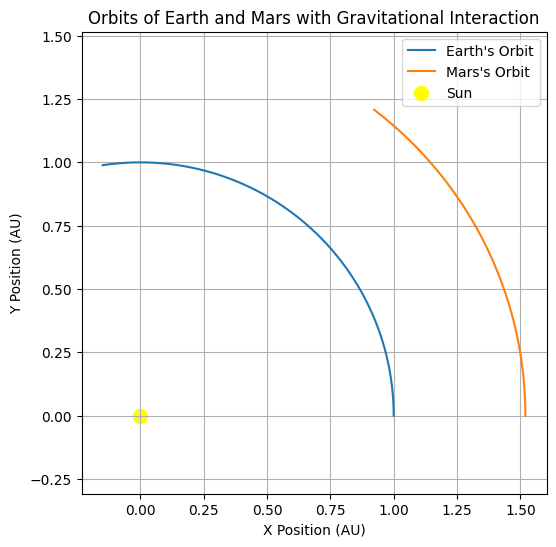

In [16]:
import numpy as np
import matplotlib.pyplot as plt  

# Constants and conversions
G = 6.67430e-11  # m^3/kg/s^2
AU = 1.496e11  # meters
day_in_seconds = 86400  # seconds

M_earth = 5.972e24  # kg
GM_earth = (G * M_earth) / (AU**3 / day_in_seconds**2)  # AU^3/day^2

M_sun = 1.989e30  # kg
GM = (G * M_sun) / (AU**3 / day_in_seconds**2)  # AU^3/day^2

# Leapfrog integrator
def leapfrog(lfdiffeq, r0, v0, t, h, *args):
    hh = h / 2.0
    r1 = r0 + hh * lfdiffeq(0, r0, v0, t, *args)
    v1 = v0 + h * lfdiffeq(1, r1, v0, t + hh, *args)
    r1 = r1 + hh * lfdiffeq(0, r0, v1, t + h, *args)
    return r1, v1

def earth(id, r, v, t, *args):
    if id == 0: 
        return v
    s = np.linalg.norm(r)
    return -GM * r / (s ** 3)

def mars(id, r, v, t, earth_pos):
    if id == 0: 
        return v
    s_mars = np.linalg.norm(r)
    mars_acc = -GM * r / (s_mars ** 3)
    r_earth_mars = r - earth_pos
    s_earth_mars = np.linalg.norm(r_earth_mars)
    earth_acc = -GM_earth * r_earth_mars / (s_earth_mars ** 3)
    return mars_acc + earth_acc

def plot_orbit(initial_position, initial_velocity, planet_name, earth_positions=None):
    r = np.array(initial_position)
    v = np.array(initial_velocity)
    t = 0.0
    h = 0.001
    x_vals = []
    y_vals = []
    for step in range(100000):
        if planet_name == 'Earth':
            r, v = leapfrog(earth, r, v, t, h)
            if earth_positions is not None:
                earth_positions.append(r.copy())
        elif planet_name == 'Mars':
            earth_pos = earth_positions[step] if earth_positions is not None else np.array([0, 0])
            r, v = leapfrog(mars, r, v, t, h, earth_pos)
        t += h
        x_vals.append(r[0])
        y_vals.append(r[1])
    plt.plot(x_vals, y_vals, label=f"{planet_name}'s Orbit")

# Initial conditions
earth_initial_position = [1.0, 0.0]
earth_initial_velocity = [0.0, np.sqrt(GM / earth_initial_position[0])]
mars_initial_position = [1.52, 0.0]
mars_initial_velocity = [0.0, np.sqrt(GM / mars_initial_position[0])]

earth_positions = []

# Plot orbits
plt.figure(figsize=(6, 6))
plot_orbit(earth_initial_position, earth_initial_velocity, 'Earth', earth_positions)
plot_orbit(mars_initial_position, mars_initial_velocity, 'Mars', earth_positions)
plt.scatter(0, 0, color='yellow', label="Sun", s=100)
plt.title("Orbits of Earth and Mars with Gravitational Interaction")
plt.xlabel("X Position (AU)")
plt.ylabel("Y Position (AU)")
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()


C:\Users\Zachary\AppData\Local\Temp\ipykernel_21872\3833446660.py:114: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\Zachary\anaconda3\envs\threebody\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


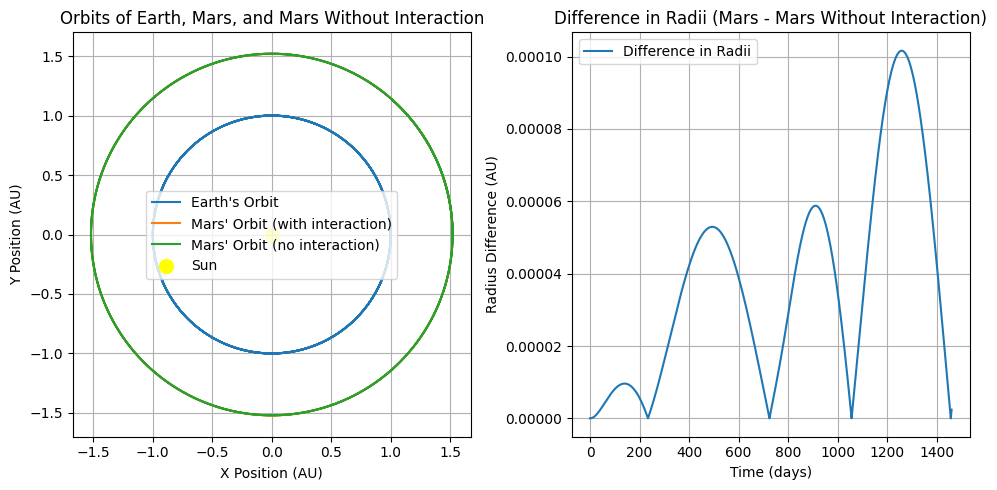

In [19]:
import numpy as np
import matplotlib.pyplot as plt  

# Constants and conversions
G = 6.67430e-11  # m^3/kg/s^2
AU = 1.496e11  # meters
day_in_seconds = 86400  # seconds

M_earth = 5.972e24  # kg
GM_earth = (G * M_earth) / (AU**3 / day_in_seconds**2)  # AU^3/day^2

M_sun = 1.989e30  # kg
GM = (G * M_sun) / (AU**3 / day_in_seconds**2)  # AU^3/day^2

# Leapfrog integrator
def leapfrog(lfdiffeq, r0, v0, t, h, *args):
    hh = h / 2.0
    r1 = r0 + hh * lfdiffeq(0, r0, v0, t, *args)
    v1 = v0 + h * lfdiffeq(1, r1, v0, t + hh, *args)
    r1 = r1 + hh * lfdiffeq(0, r0, v1, t + h, *args)
    return r1, v1

def earth(id, r, v, t, *args):
    if id == 0: 
        return v
    s = np.linalg.norm(r)
    return -GM * r / (s ** 3)

def mars(id, r, v, t, earth_pos):
    if id == 0: 
        return v
    s_mars = np.linalg.norm(r)
    mars_acc = -GM * r / (s_mars ** 3)
    r_earth_mars = r - earth_pos
    s_earth_mars = np.linalg.norm(r_earth_mars)
    earth_acc = -GM_earth * r_earth_mars / (s_earth_mars ** 3)
    return mars_acc + earth_acc

# Mars without interaction
def mars_without_interaction(id, r, v, t):
    if id == 0: 
        return v
    s = np.linalg.norm(r)
    return -GM * r / (s ** 3)

def plot_orbit(initial_position, initial_velocity, planet_name, earth_positions=None, total_days=365, interaction=True):
    r = np.array(initial_position)
    v = np.array(initial_velocity)
    t = 0.0
    h = 0.001  # Time step in days
    num_steps = int(total_days / h)  # Calculate the total number of steps

    x_vals = []
    y_vals = []
    radii = []
    for step in range(num_steps):
        if planet_name == 'Earth':
            r, v = leapfrog(earth, r, v, t, h)
            if earth_positions is not None:
                earth_positions.append(r.copy())
        elif planet_name == 'Mars':
            earth_pos = earth_positions[step] if earth_positions is not None else np.array([0, 0])
            if interaction:
                r, v = leapfrog(mars, r, v, t, h, earth_pos)
            else:
                r, v = leapfrog(mars_without_interaction, r, v, t, h)
        t += h
        x_vals.append(r[0])
        y_vals.append(r[1])
        radii.append(np.linalg.norm(r))
    return x_vals, y_vals, radii

# Initial conditions
earth_initial_position = [1.0, 0.0]
earth_initial_velocity = [0.0, np.sqrt(GM / earth_initial_position[0])]
mars_initial_position = [1.52, 0.0]
mars_initial_velocity = [0.0, np.sqrt(GM / mars_initial_position[0])]

earth_positions = []

# Set simulation duration (in Earth days)
simulation_duration = 1460  # Simulate for 2 Earth years

# Simulate orbits
plt.figure(figsize=(10, 5))

# First plot: Orbits of Earth, Mars, and Mars without interaction
plt.subplot(1, 2, 1)
earth_x, earth_y, _ = plot_orbit(earth_initial_position, earth_initial_velocity, 'Earth', earth_positions, total_days=simulation_duration)
mars_x, mars_y, mars_radii = plot_orbit(mars_initial_position, mars_initial_velocity, 'Mars', earth_positions, total_days=simulation_duration, interaction=True)
mars_wo_x, mars_wo_y, mars_wo_radii = plot_orbit(mars_initial_position, mars_initial_velocity, 'Mars', earth_positions, total_days=simulation_duration, interaction=False)
plt.plot(earth_x, earth_y, label="Earth's Orbit")
plt.plot(mars_x, mars_y, label="Mars' Orbit (with interaction)")
plt.plot(mars_wo_x, mars_wo_y, label="Mars' Orbit (no interaction)")
plt.scatter(0, 0, color='yellow', label="Sun", s=100)
plt.title("Orbits of Earth, Mars, and Mars Without Interaction")
plt.xlabel("X Position (AU)")
plt.ylabel("Y Position (AU)")
plt.axis('equal')
plt.legend()
plt.grid(True)

# Second plot: Difference in radii
plt.subplot(1, 2, 2)
radius_difference = np.abs(np.array(mars_radii) - np.array(mars_wo_radii))
time_array = np.linspace(0, simulation_duration, len(radius_difference))
plt.plot(time_array, radius_difference, label="Difference in Radii")
plt.title("Difference in Radii (Mars - Mars Without Interaction)")
plt.xlabel("Time (days)")
plt.ylabel("Radius Difference (AU)")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


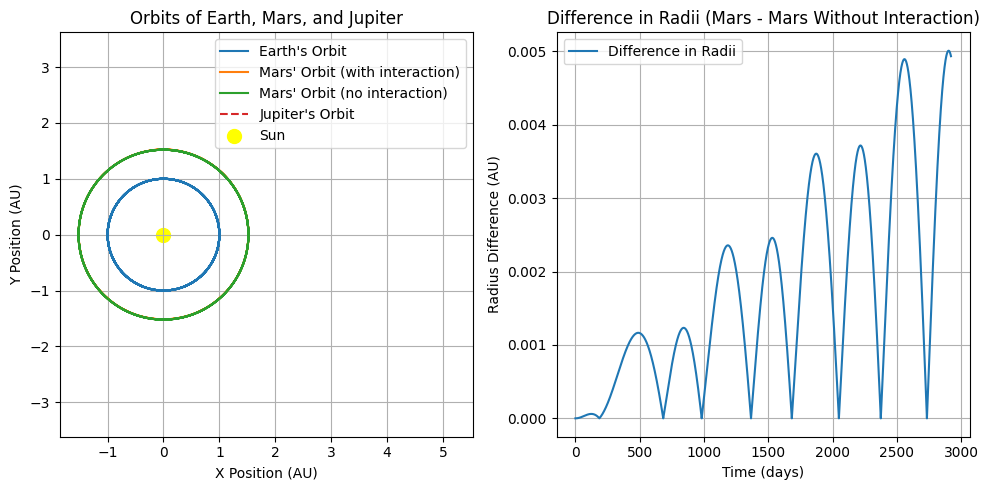

In [17]:
import numpy as np
import matplotlib.pyplot as plt  

# Constants and conversions
G = 6.67430e-11  # m^3/kg/s^2
AU = 1.496e11  # meters
day_in_seconds = 86400  # seconds

M_earth = 5.972e24  # kg
GM_earth = (G * M_earth) / (AU**3 / day_in_seconds**2)  # AU^3/day^2

M_sun = 1.989e30  # kg
GM = (G * M_sun) / (AU**3 / day_in_seconds**2)  # AU^3/day^2

M_jupiter = 1.898e27  # kg
GM_jupiter = (G * M_jupiter) / (AU**3 / day_in_seconds**2)  # AU^3/day^2

# Leapfrog integrator
def leapfrog(lfdiffeq, r0, v0, t, h, *args):
    hh = h / 2.0
    r1 = r0 + hh * lfdiffeq(0, r0, v0, t, *args)
    v1 = v0 + h * lfdiffeq(1, r1, v0, t + hh, *args)
    r1 = r1 + hh * lfdiffeq(0, r0, v1, t + h, *args)
    return r1, v1

def earth(id, r, v, t, *args):
    if id == 0: 
        return v
    s = np.linalg.norm(r)
    return -GM * r / (s ** 3)

def mars(id, r, v, t, earth_pos, jupiter_pos):
    if id == 0: 
        return v
    s_mars = np.linalg.norm(r)
    mars_acc = -GM * r / (s_mars ** 3)
    r_earth_mars = r - earth_pos
    s_earth_mars = np.linalg.norm(r_earth_mars)
    earth_acc = -GM_earth * r_earth_mars / (s_earth_mars ** 3)
    
    r_jupiter_mars = r - jupiter_pos
    s_jupiter_mars = np.linalg.norm(r_jupiter_mars)
    jupiter_acc = -GM_jupiter * r_jupiter_mars / (s_jupiter_mars ** 3)
    
    return mars_acc + earth_acc + jupiter_acc

# Mars without interaction
def mars_without_interaction(id, r, v, t):
    if id == 0: 
        return v
    s = np.linalg.norm(r)
    return -GM * r / (s ** 3)

def plot_orbit(initial_position, initial_velocity, planet_name, earth_positions=None, jupiter_positions=None, total_days=365, interaction=True):
    r = np.array(initial_position)
    v = np.array(initial_velocity)
    t = 0.0
    h = 0.001  # Time step in days
    num_steps = int(total_days / h)  # Calculate the total number of steps

    x_vals = []
    y_vals = []
    radii = []
    
    # If jupiter_positions is None, initialize it as an empty list
    if jupiter_positions is None:
        jupiter_positions = []
        
    for step in range(num_steps):
        if planet_name == 'Earth':
            r, v = leapfrog(earth, r, v, t, h)
            if earth_positions is not None:
                earth_positions.append(r.copy())
        elif planet_name == 'Mars':
            earth_pos = earth_positions[step] if earth_positions is not None else np.array([0, 0])
            jupiter_pos = jupiter_positions[step] if jupiter_positions else np.array([5.2, 0])  # Jupiter at 5.2 AU
            
            if interaction:
                r, v = leapfrog(mars, r, v, t, h, earth_pos, jupiter_pos)
            else:
                r, v = leapfrog(mars_without_interaction, r, v, t, h)
        
        # Record the position for plotting
        x_vals.append(r[0])
        y_vals.append(r[1])
        radii.append(np.linalg.norm(r))
        
        # Update Jupiter's position for the next step
        if planet_name == 'Jupiter':
            jupiter_positions.append(r.copy())  # Append Jupiter's position
    
        t += h
        
    return x_vals, y_vals, radii

# Initial conditions
earth_initial_position = [1.0, 0.0]
earth_initial_velocity = [0.0, np.sqrt(GM / earth_initial_position[0])]
mars_initial_position = [1.52, 0.0]
mars_initial_velocity = [0.0, np.sqrt(GM / mars_initial_position[0])]
jupiter_initial_position = [5.2, 0.0]
jupiter_initial_velocity = [0.0, np.sqrt(GM / jupiter_initial_position[0])]

earth_positions = []
jupiter_positions = []

# Set simulation duration (in Earth days)
simulation_duration = 365*4.5 # Simulate for 2 Earth years

# Simulate orbits
plt.figure(figsize=(10, 5))

# First plot: Orbits of Earth, Mars, and Mars without interaction
plt.subplot(1, 2, 1)
earth_x, earth_y, _ = plot_orbit(earth_initial_position, earth_initial_velocity, 'Earth', earth_positions, jupiter_positions, total_days=simulation_duration)
mars_x, mars_y, mars_radii = plot_orbit(mars_initial_position, mars_initial_velocity, 'Mars', earth_positions, jupiter_positions, total_days=simulation_duration, interaction=True)
mars_wo_x, mars_wo_y, mars_wo_radii = plot_orbit(mars_initial_position, mars_initial_velocity, 'Mars', earth_positions, jupiter_positions, total_days=simulation_duration, interaction=False)

jupiter_x, jupiter_y, _ = plot_orbit(jupiter_initial_position, jupiter_initial_velocity, 'Jupiter', earth_positions, jupiter_positions, total_days=simulation_duration)

plt.plot(earth_x, earth_y, label="Earth's Orbit")
plt.plot(mars_x, mars_y, label="Mars' Orbit (with interaction)")
plt.plot(mars_wo_x, mars_wo_y, label="Mars' Orbit (no interaction)")
plt.plot(jupiter_x, jupiter_y, label="Jupiter's Orbit", linestyle='--')
plt.scatter(0, 0, color='yellow', label="Sun", s=100)
plt.title("Orbits of Earth, Mars, and Jupiter")
plt.xlabel("X Position (AU)")
plt.ylabel("Y Position (AU)")
plt.axis('equal')
plt.legend()
plt.grid(True)

# Second plot: Difference in radii
plt.subplot(1, 2, 2)
radius_difference = np.abs(np.array(mars_radii) - np.array(mars_wo_radii))
time_array = np.linspace(0, simulation_duration, len(radius_difference))
plt.plot(time_array, radius_difference, label="Difference in Radii")
plt.title("Difference in Radii (Mars - Mars Without Interaction)")
plt.xlabel("Time (days)")
plt.ylabel("Radius Difference (AU)")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
G = 6.67430e-11  # m^3/kg/s^2
AU = 1.496e11  # meters
day_in_seconds = 86400  # seconds

M_sun = 1.989e30  # kg
M_jupiter = 1.898e27  # kg

# Leapfrog integrator with overflow checks
def leapfrog(lfdiffeq, r0, v0, t, h, *args):
    hh = h / 2.0
    r1 = r0 + hh * lfdiffeq(0, r0, v0, t, h, *args)
    v1 = v0 + h * lfdiffeq(1, r1, v0, t + hh, h, *args)
    r1 = r1 + hh * lfdiffeq(0, r0, v1, t + h, h, *args)
    
    # Check for overflow in positions and velocities
    if np.any(np.abs(r1) > 1e15) or np.any(np.abs(v1) > 1e5):
        print("Warning: Overflow in positions or velocities!")
        r1 = np.clip(r1, -1e15, 1e15)  # Clip large values to avoid overflow
        v1 = np.clip(v1, -1e5, 1e5)  # Clip velocities to avoid overflow
    
    return r1, v1

def sun_jupiter_system(id, r, v, t, h, *args):
    if id == 0:
        return v
    r_sun = r[0]
    r_jupiter = r[1]
    
    # Calculate the force on each body due to gravity
    r_vector = r_jupiter - r_sun
    dist = np.linalg.norm(r_vector)
    force = -G * M_sun * M_jupiter / dist**2
    
    # Acceleration for Sun and Jupiter
    acc_sun = force * r_vector / (M_sun * dist)
    acc_jupiter = -force * r_vector / (M_jupiter * dist)
    
    # Update velocity based on acceleration
    v_sun = v[0] + acc_sun * h
    v_jupiter = v[1] + acc_jupiter * h
    
    return np.array([v_sun, v_jupiter])

# Center of mass position
def center_of_mass_position(sun_pos, jupiter_pos):
    total_mass = M_sun + M_jupiter
    com = (M_sun * sun_pos + M_jupiter * jupiter_pos) / total_mass
    return com

# Main simulation function
def plot_orbit_with_com(sun_initial_position, sun_initial_velocity, jupiter_initial_position, jupiter_initial_velocity, total_days=365):
    r_sun = np.array(sun_initial_position)
    v_sun = np.array(sun_initial_velocity)
    r_jupiter = np.array(jupiter_initial_position)
    v_jupiter = np.array(jupiter_initial_velocity)
    
    t = 0.0
    h = 0.0001  # Smaller time step to prevent overflow
    num_steps = int(total_days / h)

    sun_positions = []
    jupiter_positions = []
    com_positions = []
    
    for step in range(num_steps):
        r = np.array([r_sun, r_jupiter])
        v = np.array([v_sun, v_jupiter])
        
        r, v = leapfrog(sun_jupiter_system, r, v, t, h)

        r_sun, r_jupiter = r[0], r[1]
        v_sun, v_jupiter = v[0], v[1]
        
        sun_positions.append(r_sun)
        jupiter_positions.append(r_jupiter)
        
        # Compute COM position
        com_pos = center_of_mass_position(r_sun, r_jupiter)
        com_positions.append(com_pos)
        
        t += h

    return np.array(sun_positions), np.array(jupiter_positions), np.array(com_positions)

# Initial conditions
sun_initial_position = [0.0, 0.0]
sun_initial_velocity = [0.0, 0.0]
jupiter_initial_position = [5.2, 0.0]  # 5.2 AU from the Sun
jupiter_initial_velocity = [0.0, np.sqrt(G * M_sun / 5.2)]  # Jupiter's orbital velocity

# Simulate for 1 Earth year
simulation_duration = 365  # days

# Run the simulation
sun_pos, jupiter_pos, com_pos = plot_orbit_with_com(sun_initial_position, sun_initial_velocity, jupiter_initial_position, jupiter_initial_velocity, total_days=simulation_duration)

# First plot: Jupiter's orbit and Sun's orbital wobble
plt.figure(figsize=(10, 5))

# Plot Jupiter's orbit
plt.subplot(1, 2, 1)
plt.plot(jupiter_pos[:, 0], jupiter_pos[:, 1], label="Jupiter's Orbit")
plt.plot(sun_pos[:, 0], sun_pos[:, 1], label="Sun's Orbit (Wobble)", linestyle='--')
plt.scatter(0, 0, color='yellow', label="Sun")
plt.title("Jupiter's Orbit and Sun's Orbital Wobble")
plt.xlabel("X Position (AU)")
plt.ylabel("Y Position (AU)")
plt.legend()
plt.axis('equal')
plt.grid(True)

# Second plot: Sun's wobble relative to the COM
plt.subplot(1, 2, 2)
distance_from_com = np.linalg.norm(sun_pos - com_pos, axis=1)
plt.plot(distance_from_com, label="Sun's Distance from COM")
plt.title("Sun's Distance from the Center of Mass")
plt.xlabel("Time (days)")
plt.ylabel("Distance (AU)")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Print the final value of the distance from COM at the end of the simulation
print(f"Final distance from the COM: {distance_from_com[-1]:.6f} AU")


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



KeyboardInterrupt: 

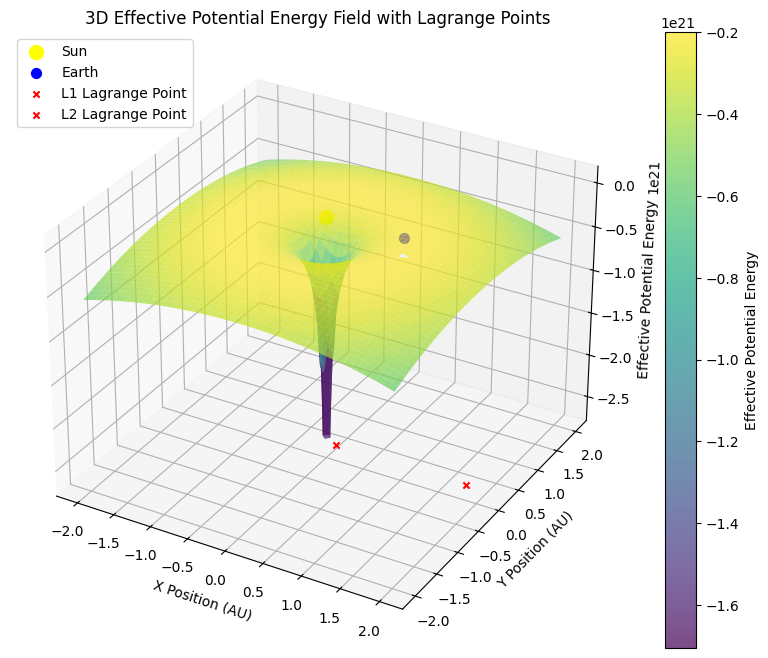

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Constants
GM = 1.327 * 10**20  # Gravitational constant * mass of Sun in m^3/s^2 (use AU units for simplicity)
GM_earth = 3.986 * 10**14  # Gravitational constant * mass of Earth in m^3/s^2 (use AU units)
omega = np.sqrt(GM / (1.0**3))  # Angular velocity of Earth around the Sun (in AU^3/day^2)

# Grid for plotting (focus on the area near the Sun and Earth)
grid_size = 2.0  # Size of the grid in AU
resolution = 500  # Increase resolution to focus on the Lagrange points
x = np.linspace(-grid_size, grid_size, resolution)
y = np.linspace(-grid_size, grid_size, resolution)
X, Y = np.meshgrid(x, y)

# Distances from the Sun and Earth
r_sun = np.sqrt(X**2 + Y**2)  # Distance to the Sun
r_earth = np.sqrt((X - 1.0)**2 + Y**2)  # Distance to Earth

# Effective potential in the rotating frame (includes centrifugal term)
phi_eff = (-GM / r_sun) - (GM_earth / r_earth) - 0.5 * omega**2 * (X**2 + Y**2)

# Mask regions close to the Sun or Earth to avoid singularities
phi_eff[r_sun < 0.05] = np.nan
phi_eff[r_earth < 0.05] = np.nan

# Calculate the positions of the Lagrange points (approximation)
L1 = 1 - np.sqrt(3) / 2  # Approximate L1 position along the x-axis
L2 = 1 + np.sqrt(3) / 2  # Approximate L2 position along the x-axis

# 3D Plot of the Effective Potential Energy Field
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface of the effective potential
surf = ax.plot_surface(X, Y, phi_eff, cmap='viridis', edgecolor='none', alpha=0.7)
fig.colorbar(surf, label="Effective Potential Energy")

# Plot the Sun and Earth positions
ax.scatter(0, 0, 0, color='yellow', label="Sun", s=100)  # Sun at the origin
ax.scatter(1.0, 0, 0, color='blue', label="Earth", s=50)  # Earth at (1, 0)

# Plot the approximate positions of the Lagrange points
ax.scatter(L1, 0, np.nanmin(phi_eff), color='red', marker='x', label="L1 Lagrange Point")
ax.scatter(L2, 0, np.nanmin(phi_eff), color='red', marker='x', label="L2 Lagrange Point")

# Labels and title
ax.set_xlabel("X Position (AU)")
ax.set_ylabel("Y Position (AU)")
ax.set_zlabel("Effective Potential Energy")
ax.set_title("3D Effective Potential Energy Field with Lagrange Points")
ax.legend(loc='upper left')

plt.show()


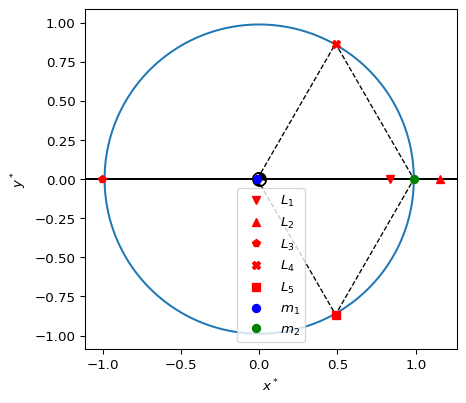

In [24]:
import matplotlib.path as mpath
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import newton

# This code defines a nice shape for the center of mass of the system.
circle = mpath.Path.unit_circle()
wedge_1 = mpath.Path.wedge(90, 180)
wedge_2 = mpath.Path.wedge(270, 0)

verts = np.concatenate(
    [circle.vertices, wedge_1.vertices[::-1, ...], wedge_2.vertices[::-1, ...]]
)
codes = np.concatenate([circle.codes, wedge_1.codes, wedge_2.codes])
center_of_mass = mpath.Path(verts, codes)

# These masses represent the Earth-Moon system
m_1 = 5.974e24  # kg
m_2 = 7.348e22  # kg
pi_2 = m_2 / (m_1 + m_2)

# These give us the coordinates of the orbits of m_2 and m_1
x_2 = (1 - pi_2) * np.cos(np.linspace(0, np.pi, 100))
y_2 = (1 - pi_2) * np.sin(np.linspace(0, np.pi, 100))
x_1 = (-pi_2) * np.cos(np.linspace(0, np.pi, 100))
y_1 = (-pi_2) * np.sin(np.linspace(0, np.pi, 100))

def collinear_lagrange(xstar, pi_2):
    """Calculate the resultant of the collinear Lagrange point equation.

    This is a function f(xstar, pi_2), where xstar is the nondimensional x coordinate
    and pi_2 is the nondimensional mass ratio. The function should be passed to
    scipy.optimize.newton (or another Newton solver) to find a value for xstar
    that satsifies the equation, for a given value of pi_2.

    The solver will try different values of xstar until the return value is equal to
    zero.
    """
    first_term = xstar
    second_term = (1 - pi_2) / np.abs(xstar + pi_2) ** 3 * (xstar + pi_2)
    third_term = pi_2 / np.abs(xstar - 1 + pi_2) ** 3 * (xstar - 1 + pi_2)
    return first_term - second_term - third_term

L_2 = newton(func=collinear_lagrange, x0=1, args=(pi_2,))
L_1 = newton(func=collinear_lagrange, x0=0, args=(pi_2,))
L_3 = newton(func=collinear_lagrange, x0=-1, args=(pi_2,))

fig, ax = plt.subplots(figsize=(5, 5), dpi=96)
ax.set_xlabel("$x^*$")
ax.set_ylabel("$y^*$")

# Plot the orbits
ax.axhline(0, color="k")
ax.plot(np.hstack((x_2, x_2[::-1])), np.hstack((y_2, -y_2[::-1])))
ax.plot(np.hstack((x_1, x_1[::-1])), np.hstack((y_1, -y_1[::-1])))
ax.plot(
    [-pi_2, 0.5 - pi_2, 1 - pi_2, 0.5 - pi_2, -pi_2],
    [0, np.sqrt(3) / 2, 0, -np.sqrt(3) / 2, 0],
    "k",
    ls="--",
    lw=1,
)

# Plot the Lagrange Points and masses
ax.plot(L_1, 0, "rv", label="$L_1$")
ax.plot(L_2, 0, "r^", label="$L_2$")
ax.plot(L_3, 0, "rp", label="$L_3$")
ax.plot(0.5 - pi_2, np.sqrt(3) / 2, "rX", label="$L_4$")
ax.plot(0.5 - pi_2, -np.sqrt(3) / 2, "rs", label="$L_5$")
ax.plot(0, 0, "k", marker=center_of_mass, markersize=10)
ax.plot(-pi_2, 0, "bo", label="$m_1$")
ax.plot(1 - pi_2, 0, "go", label="$m_2$")
ax.legend()
ax.set_aspect("equal")

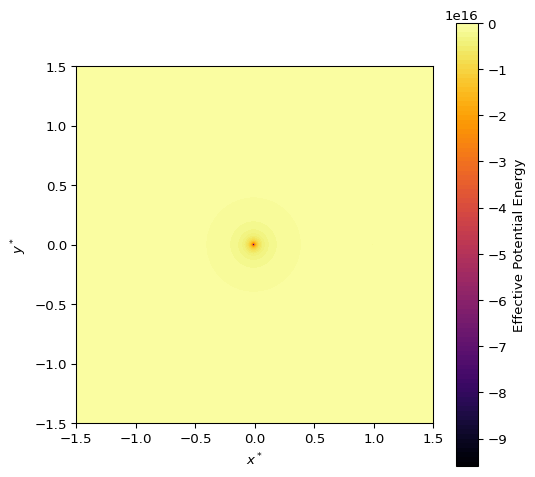

In [12]:
import matplotlib.path as mpath
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import newton

# Constants
G = 6.67430e-11  # Gravitational constant (m^3 kg^-1 s^-2)
m_1 = 5.974e24  # kg (Earth)
m_2 = 7.348e22  # kg (Moon)
pi_2 = m_2 / (m_1 + m_2)

# Define the effective potential
def effective_potential(x, y, pi_2):
    r1 = np.sqrt((x + pi_2)**2 + y**2)  # Distance from m1
    r2 = np.sqrt((x - 1 + pi_2)**2 + y**2)  # Distance from m2
    centrifugal_term = 0.5 * (x**2 + y**2)  # Centrifugal potential
    gravitational_term_1 = -G * m_1 / r1  # Gravitational potential due to m1
    gravitational_term_2 = -G * m_2 / r2  # Gravitational potential due to m2
    return gravitational_term_1 + gravitational_term_2 + centrifugal_term

# Create a grid of points for the plot
x_vals = np.linspace(-1.5, 1.5, 500)
y_vals = np.linspace(-1.5, 1.5, 500)
X, Y = np.meshgrid(x_vals, y_vals)
Z = effective_potential(X, Y, pi_2)

# Plot the effective potential
fig, ax = plt.subplots(figsize=(6, 6), dpi=96)
cp = ax.contourf(X, Y, Z, 100, cmap='inferno')
fig.colorbar(cp, ax=ax, label="Effective Potential Energy")
ax.set_xlabel("$x^*$")
ax.set_ylabel("$y^*$")

# Calculate the collinear Lagrange points
def collinear_lagrange(xstar, pi_2):
    first_term = xstar
    second_term = (1 - pi_2) / np.abs(xstar + pi_2) ** 3 * (xstar + pi_2)
    third_term = pi_2 / np.abs(xstar - 1 + pi_2) ** 3 * (xstar - 1 + pi_2)
    return first_term - second_term - third_term

L_2 = newton(func=collinear_lagrange, x0=1, args=(pi_2,))
L_1 = newton(func=collinear_lagrange, x0=0, args=(pi_2,))
L_3 = newton(func=collinear_lagrange, x0=-1, args=(pi_2,))

# Exclude the Lagrange points by creating a mask
exclude_points = [(L_1, 0), (L_2, 0), (L_3, 0), (0.5 - pi_2, np.sqrt(3) / 2), (0.5 - pi_2, -np.sqrt(3) / 2)]
exclude_mask = np.ones_like(Z, dtype=bool)

# Apply mask to avoid plotting around Lagrange points
for (x_lagrange, y_lagrange) in exclude_points:
    exclude_mask &= (np.sqrt((X - x_lagrange)**2 + (Y - y_lagrange)**2) > 0.05)  # Distance threshold

# Plot the effective potential with the mask
ax.contourf(X, Y, Z * exclude_mask, 100, cmap='inferno')
ax.set_aspect("equal")
plt.show()
